# CNT is target variable

## importing important libraries

In [1]:
import os
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns

## importing the data

In [2]:
train = pd.read_csv(r"D:\projects dataset\six\day.csv")
test = pd.read_csv(r"D:\projects dataset\six\test.csv")

## Exploratory data analysis

In [3]:
train.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [4]:
test.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered
0,501,16-05-2019,2,1,5,0,3,1,1,26.103347,29.79875,69.7917,8.208304,991,6433
1,502,17-05-2019,2,1,5,0,4,1,1,24.326653,28.63065,52.0000,15.374825,1242,6142
2,503,18-05-2019,2,1,5,0,5,1,1,23.130847,27.55605,52.3333,9.166739,1521,6118
3,504,19-05-2019,2,1,5,0,6,0,1,24.600000,28.34540,45.6250,5.626325,3410,4884
4,505,20-05-2019,2,1,5,0,0,0,1,25.454153,29.19835,53.0417,17.042589,2704,4425


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     499 non-null    int64  
 1   dteday      499 non-null    object 
 2   season      499 non-null    int64  
 3   yr          499 non-null    int64  
 4   mnth        499 non-null    int64  
 5   holiday     499 non-null    int64  
 6   weekday     499 non-null    int64  
 7   workingday  499 non-null    int64  
 8   weathersit  499 non-null    int64  
 9   temp        499 non-null    float64
 10  atemp       499 non-null    float64
 11  hum         499 non-null    float64
 12  windspeed   499 non-null    float64
 13  casual      499 non-null    int64  
 14  registered  499 non-null    int64  
 15  cnt         499 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 62.5+ KB


In [6]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230 entries, 0 to 229
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     230 non-null    int64  
 1   dteday      230 non-null    object 
 2   season      230 non-null    int64  
 3   yr          230 non-null    int64  
 4   mnth        230 non-null    int64  
 5   holiday     230 non-null    int64  
 6   weekday     230 non-null    int64  
 7   workingday  230 non-null    int64  
 8   weathersit  230 non-null    int64  
 9   temp        230 non-null    float64
 10  atemp       230 non-null    float64
 11  hum         230 non-null    float64
 12  windspeed   230 non-null    float64
 13  casual      230 non-null    int64  
 14  registered  230 non-null    int64  
dtypes: float64(4), int64(10), object(1)
memory usage: 27.1+ KB


In [7]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,499.0,250.000000,144.193157,1.000000,125.500000,250.000000,374.500000,499.000000
season,499.0,2.206413,1.095573,1.000000,1.000000,2.000000,3.000000,4.000000
yr,499.0,0.268537,0.443643,0.000000,0.000000,0.000000,1.000000,1.000000
mnth,499.0,5.515030,3.459066,1.000000,3.000000,5.000000,8.000000,12.000000
holiday,499.0,0.028056,0.165299,0.000000,0.000000,0.000000,0.000000,1.000000
weekday,499.0,2.995992,2.009012,0.000000,1.000000,3.000000,5.000000,6.000000
workingday,499.0,0.683367,0.465630,0.000000,0.000000,1.000000,1.000000,1.000000
weathersit,499.0,1.408818,0.557175,1.000000,1.000000,1.000000,2.000000,3.000000
temp,499.0,18.979325,7.350670,2.424346,12.998189,18.518347,25.215000,34.815847
atemp,499.0,22.316516,8.038017,3.953480,15.843550,22.222300,28.725925,42.044800


In [8]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,230.0,615.500000,66.539462,501.000000,558.250000,615.500000,672.750000,730.000000
season,230.0,3.134783,0.848378,1.000000,3.000000,3.000000,4.000000,4.000000
yr,230.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
mnth,230.0,8.726087,2.185446,5.000000,7.000000,9.000000,11.000000,12.000000
holiday,230.0,0.030435,0.172155,0.000000,0.000000,0.000000,0.000000,1.000000
weekday,230.0,3.004348,2.007623,0.000000,1.000000,3.000000,5.000000,6.000000
workingday,230.0,0.682609,0.466476,0.000000,0.000000,1.000000,1.000000,1.000000
weathersit,230.0,1.360870,0.516318,1.000000,1.000000,1.000000,2.000000,3.000000
temp,230.0,23.205642,7.036093,8.849153,16.306028,24.822077,29.195413,35.328347
atemp,230.0,26.762841,7.566756,11.016650,19.791388,28.693650,32.734338,40.245650


In [9]:
train.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [10]:
test.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
dtype: int64

## Data Visualization

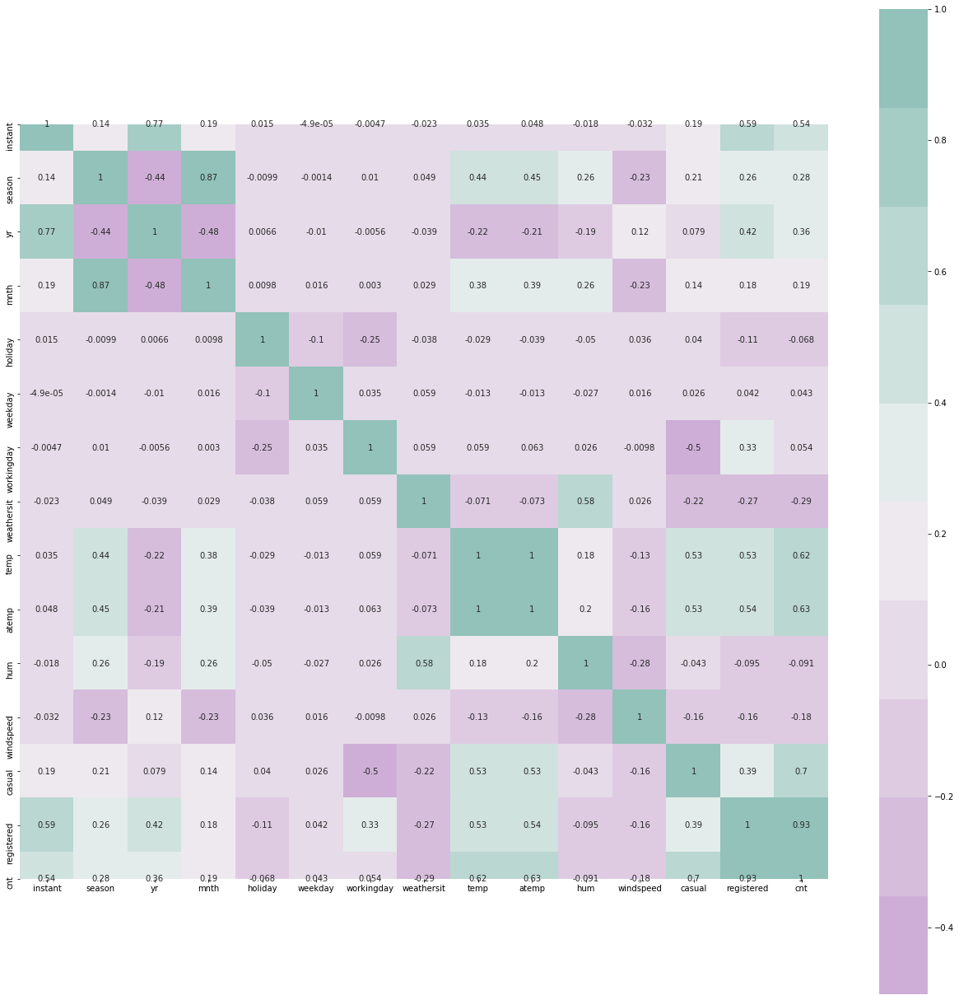

In [11]:
cmap = sns.diverging_palette(300,175,s=40,l=75,n=10)
corrmat = train.corr()
plt.subplots(figsize=(22,22))
sns.heatmap(corrmat, cmap=cmap, annot=True, square=True);

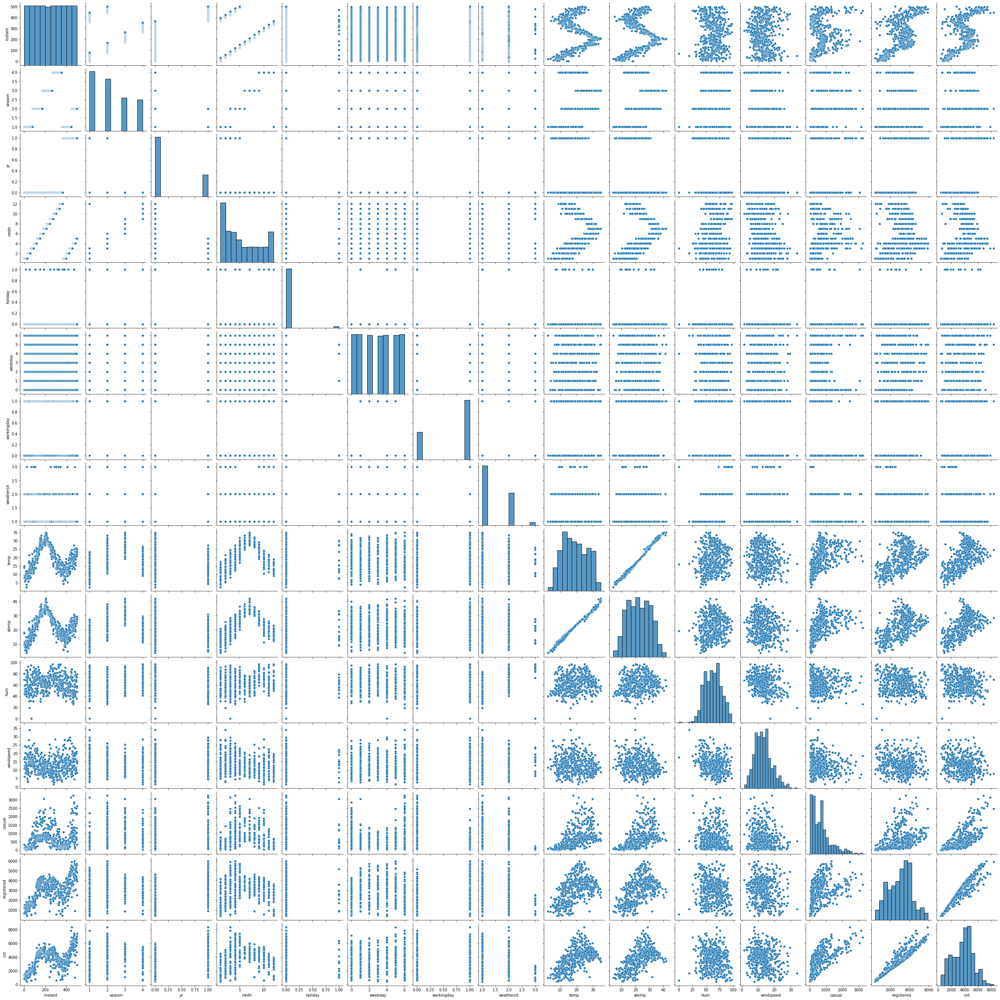

In [12]:
sns.pairplot(train)

In [13]:
import plotly.express as px
fig = px.scatter(train, x = 'temp', y = 'atemp', title ="relationship between temp and atemp")
fig.show()

In [14]:
import plotly.express as px
fig = px.scatter(train, x = 'hum', y = 'windspeed', title ="relationship between hum and windspeed")
fig.show()

In [15]:
import plotly.express as px
fig = px.scatter(train, x = 'casual', y = 'registered', title ="relationship between casual and registered")
fig.show()

In [16]:
import plotly.express as px
fig = px.scatter(train, x = 'dteday', y = 'cnt', title ="relationship between dteday and count")
fig.show()

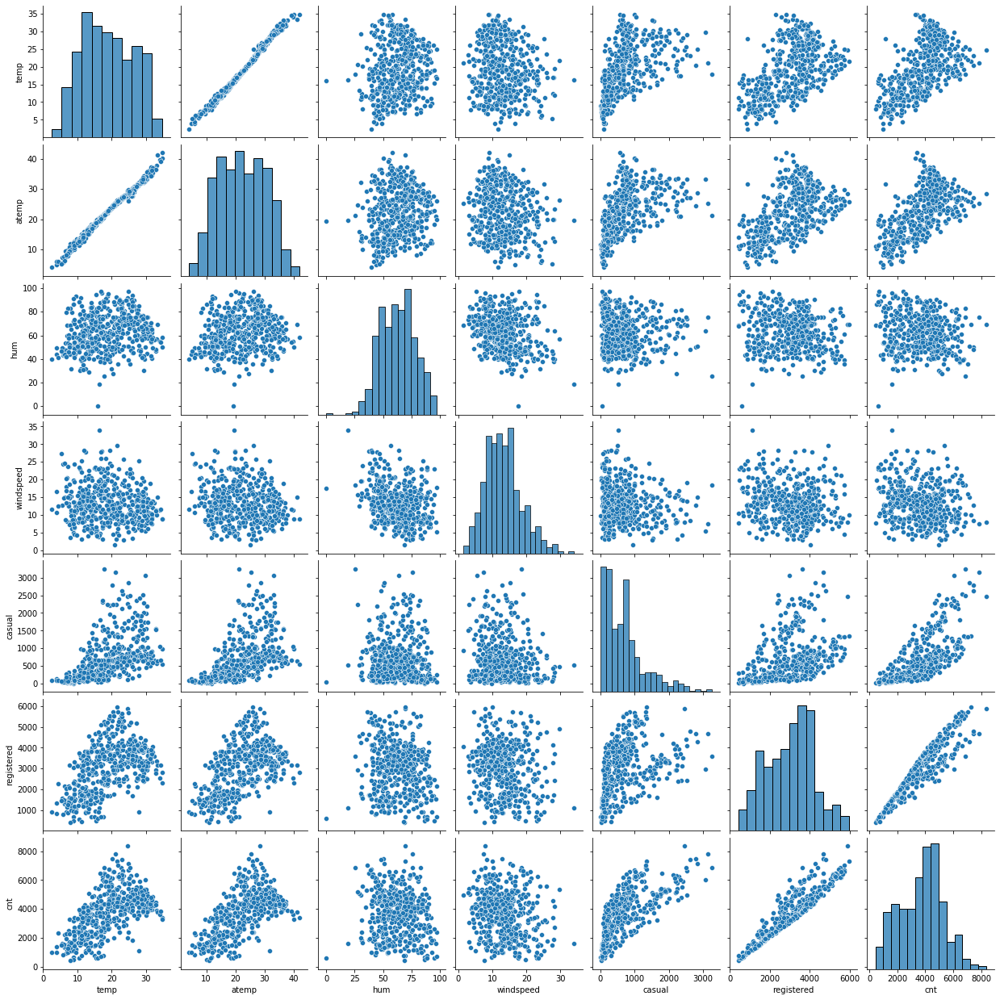

In [17]:
sns.pairplot(train[['dteday','temp','atemp','hum','windspeed','casual','registered','cnt']])

In [18]:
def px_scatter_(train,x,y):
    fig = px.scatter(train,x,y)
    fig.show()

In [19]:
px_scatter_(train,x='temp',y='atemp')

In [20]:
px_scatter_(train,x='hum',y='windspeed')

In [21]:
def plot_(train):
    plt.hist(train,bins=10)
    plt.show()

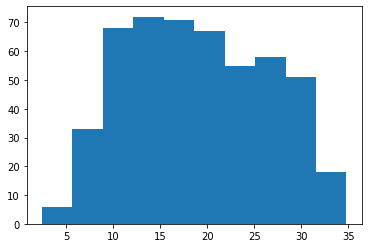

In [22]:
plot_(train['temp'])

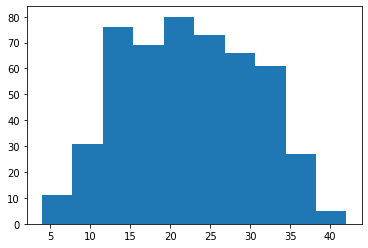

In [23]:
plot_(train['atemp'])

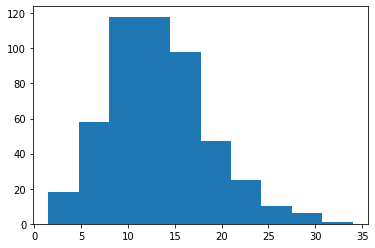

In [24]:
plot_(train['windspeed'])

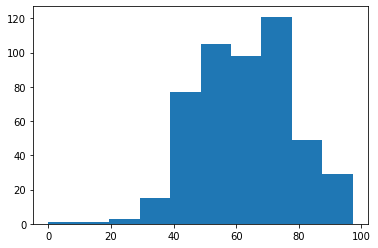

In [25]:
plot_(train['hum'])

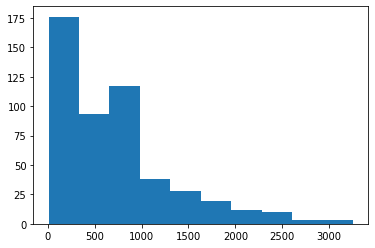

In [26]:
plot_(train['casual'])

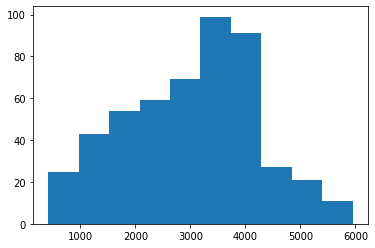

In [27]:
plot_(train['registered'])

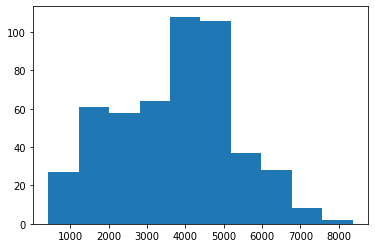

In [28]:
plot_(train['cnt'])

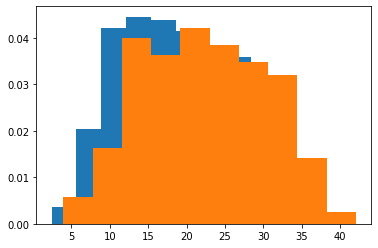

In [29]:
plt.hist(train['temp'], density=True)
plt.hist(train['atemp'],density=True)
plt.show()

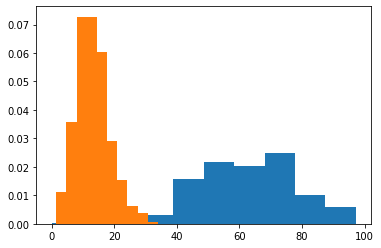

In [30]:
plt.hist(train['hum'],density=True)
plt.hist(train['windspeed'],density=True)
plt.show()

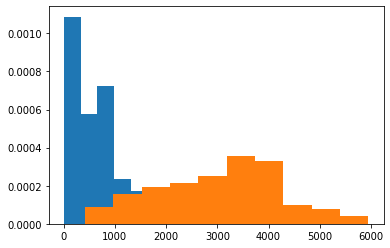

In [31]:
plt.hist(train['casual'],density=True)
plt.hist(train['registered'],density=True)
plt.show()

In [32]:
train.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


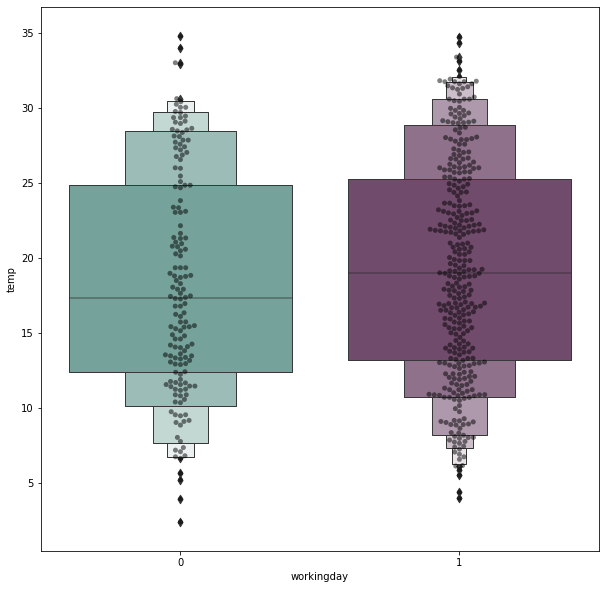

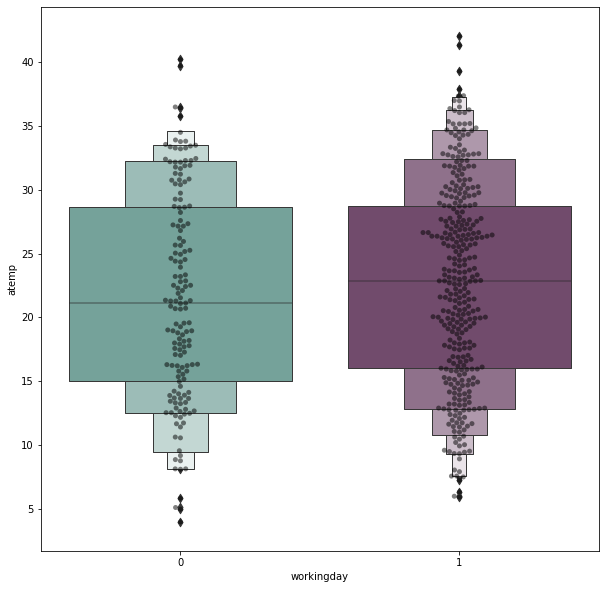

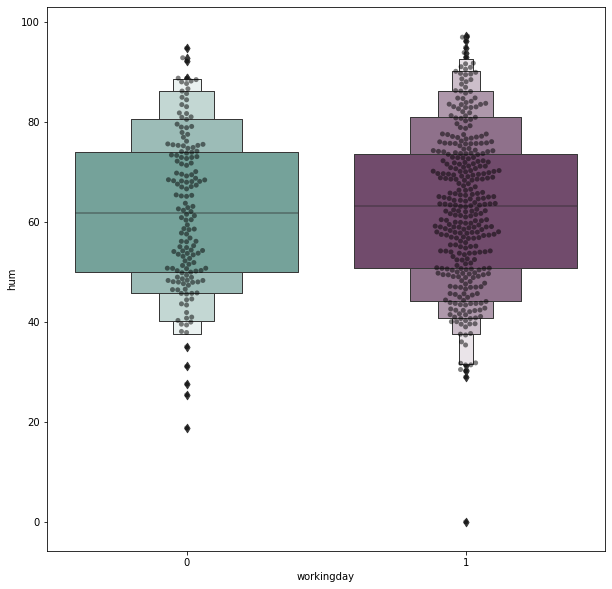

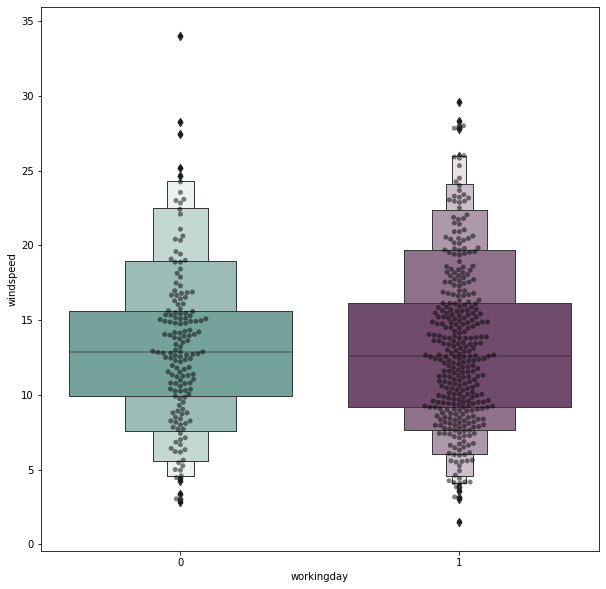

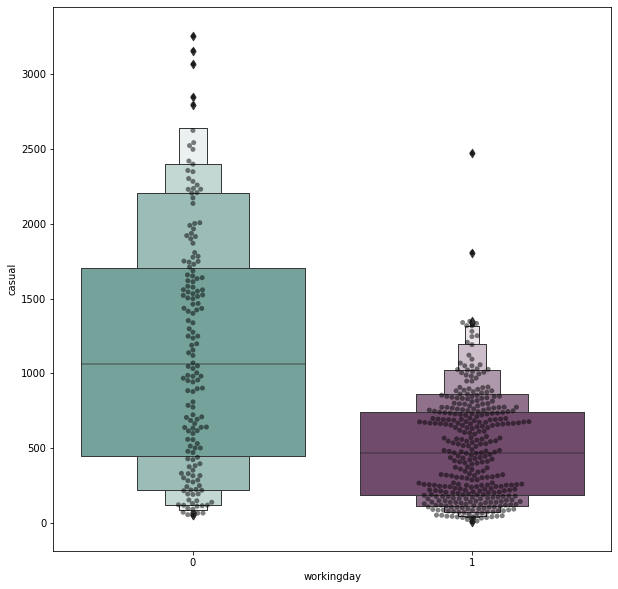

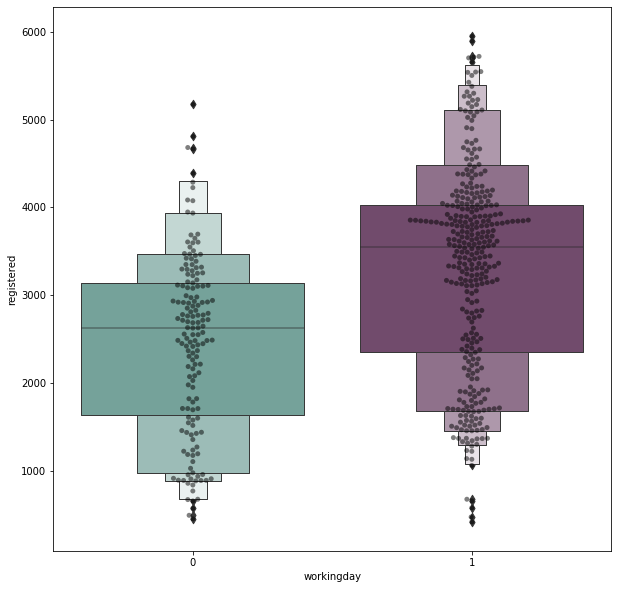

In [33]:
cols = ['#6daa9f','#774571']
feature = ['temp','atemp','hum','windspeed','casual','registered']
for i in feature:
    plt.figure(figsize=(10,10))
    sns.swarmplot(x=train['workingday'], y=train[i], color='black', alpha=0.5)
    sns.boxenplot(x=train['workingday'], y=train[i], palette=cols)
    plt.show()

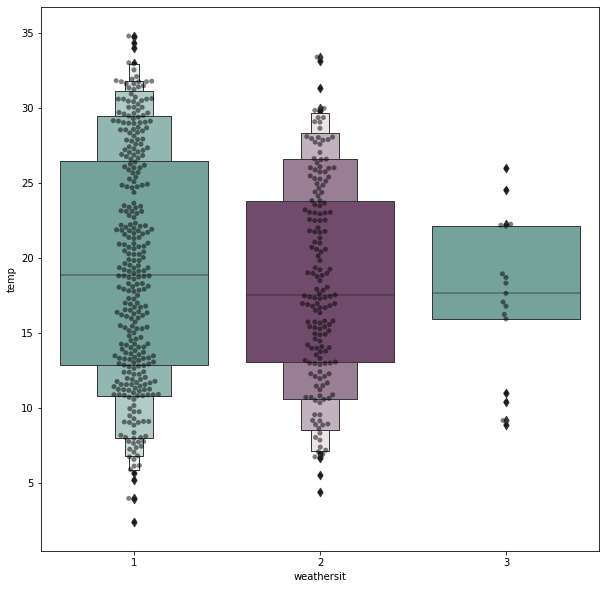

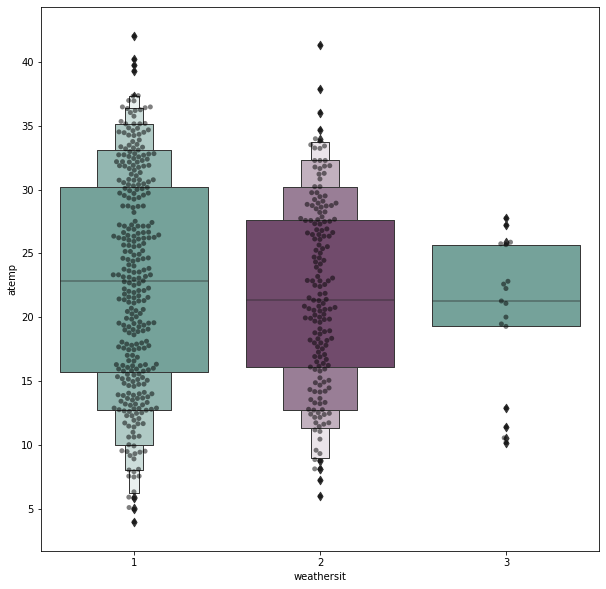

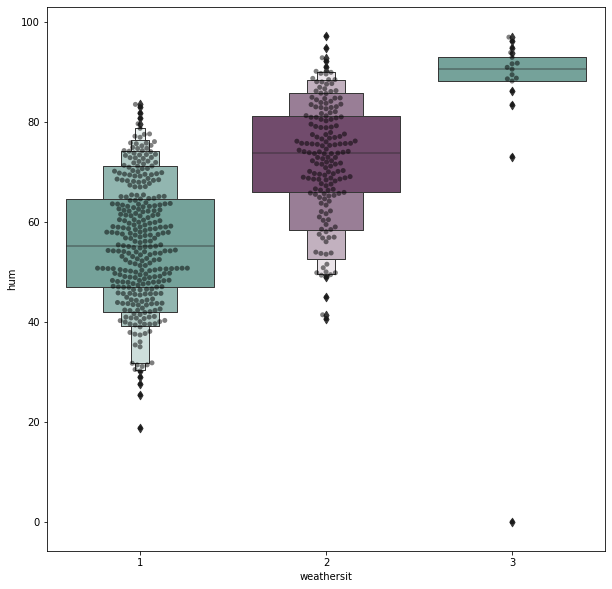

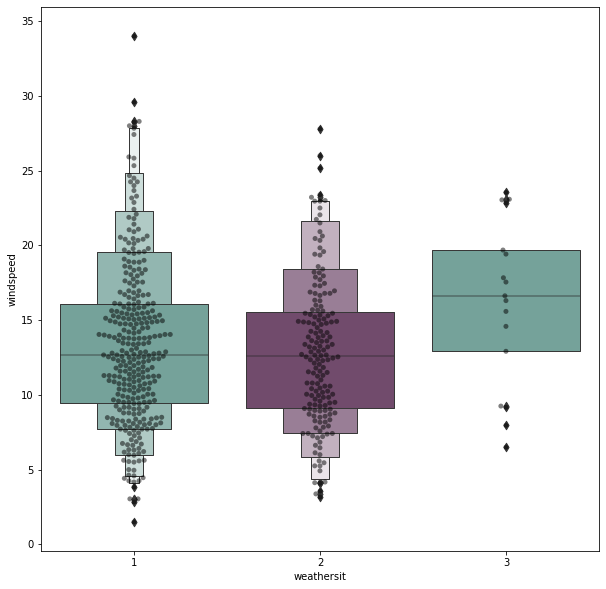

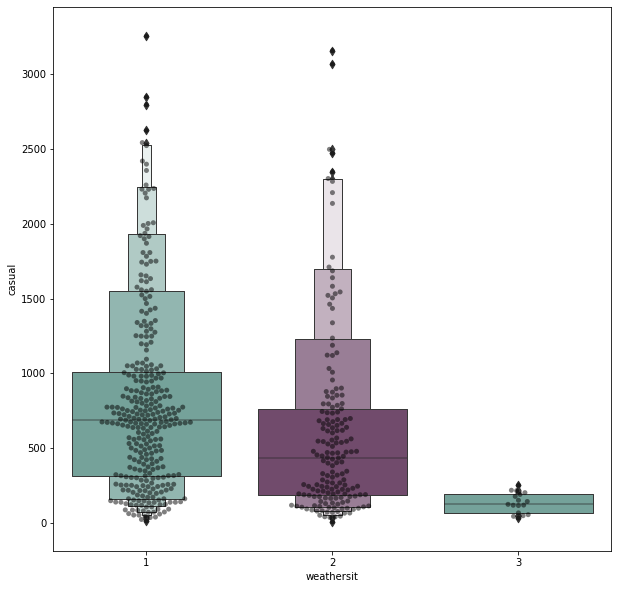

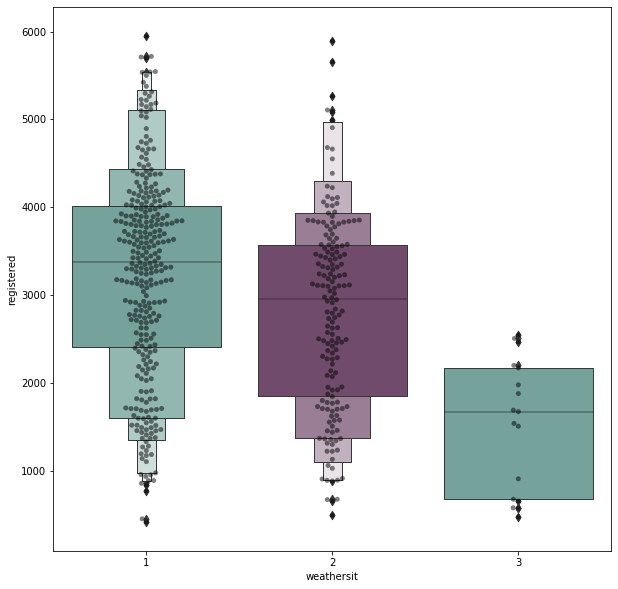

In [34]:
cols = ['#6daa9f','#774571']
feature = ['temp','atemp','hum','windspeed','casual','registered']
for i in feature:
    plt.figure(figsize=(10,10))
    sns.swarmplot(x=train['weathersit'], y=train[i], color='black', alpha=0.5)
    sns.boxenplot(x=train['weathersit'], y=train[i], palette=cols)
    plt.show()

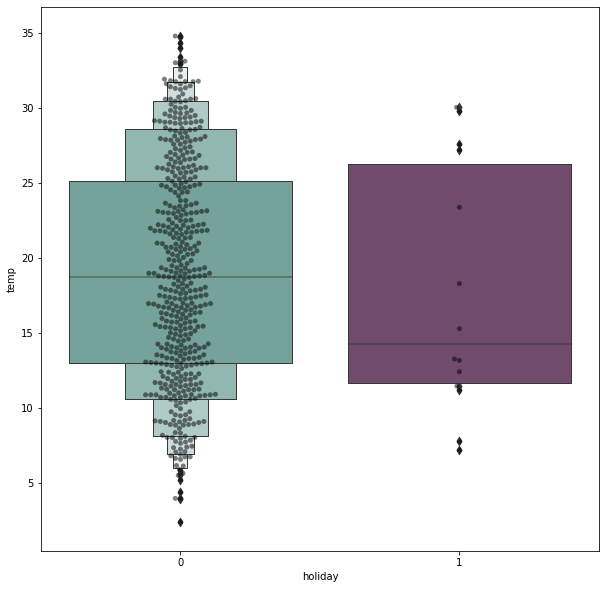

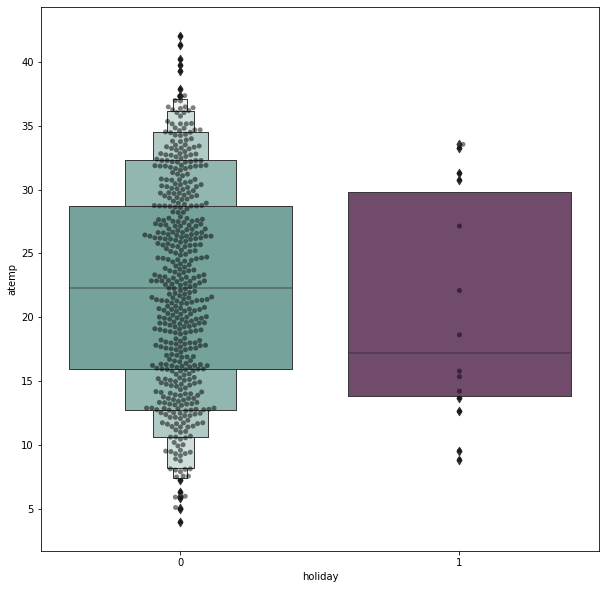

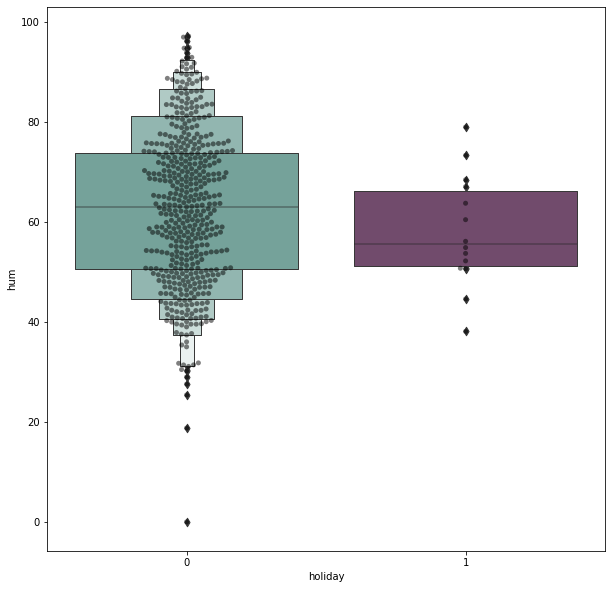

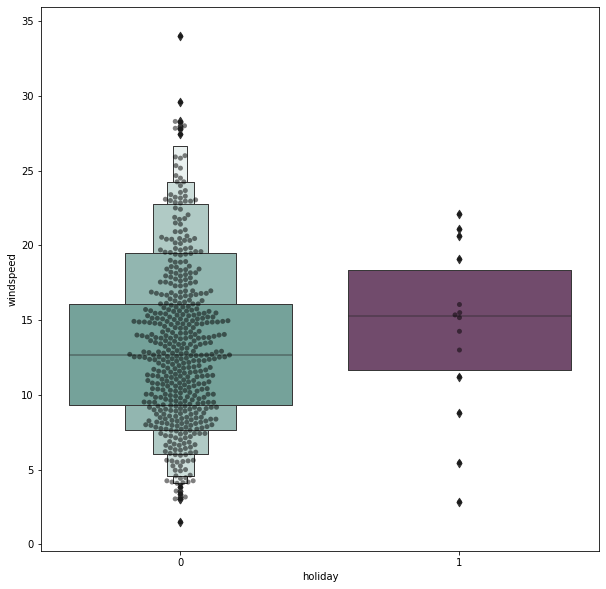

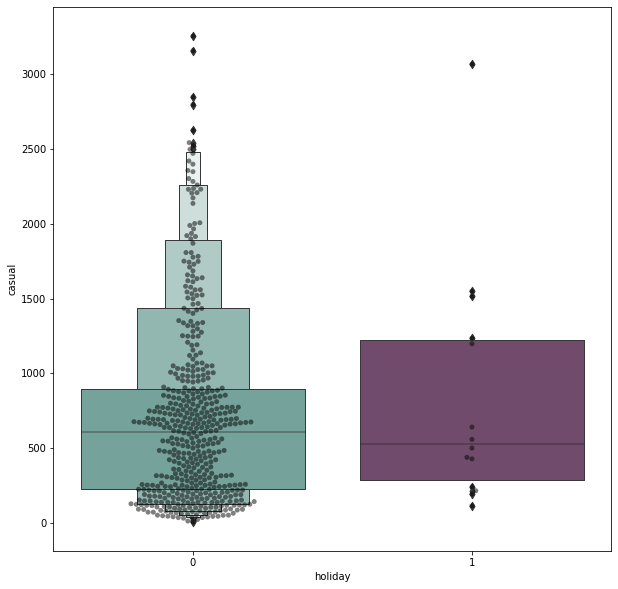

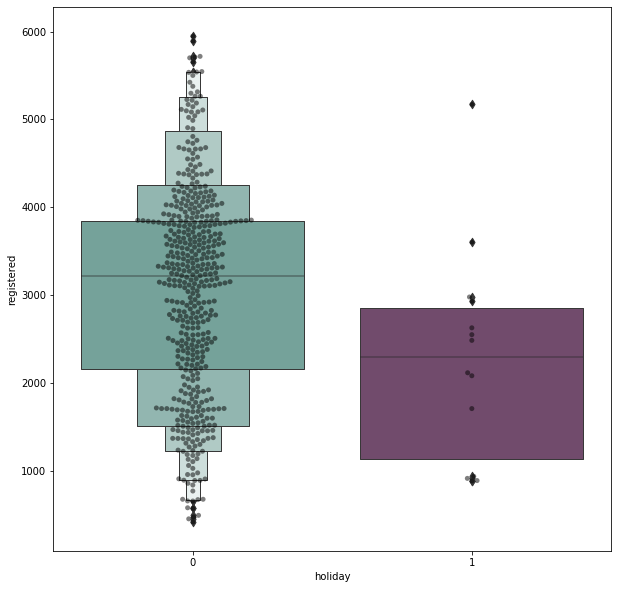

In [35]:
cols = ['#6daa9f','#774571']
feature = ['temp','atemp','hum','windspeed','casual','registered']
for i in feature:
    plt.figure(figsize=(10,10))
    sns.swarmplot(x=train['holiday'], y=train[i], color='black', alpha=0.5)
    sns.boxenplot(x=train['holiday'], y=train[i], palette=cols)
    plt.show()

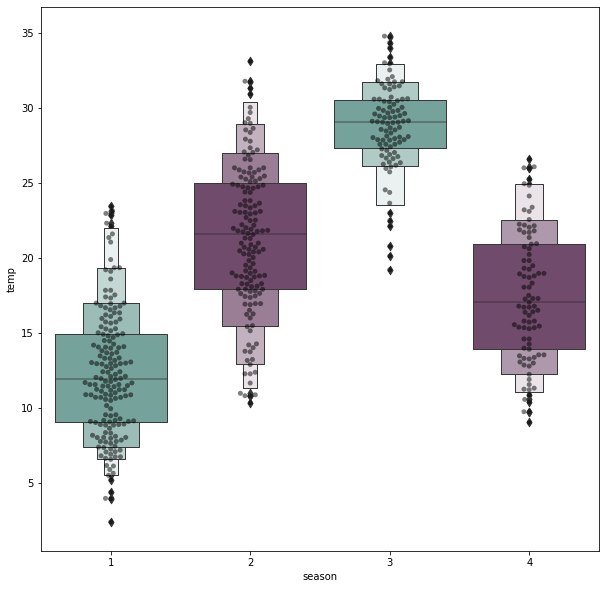

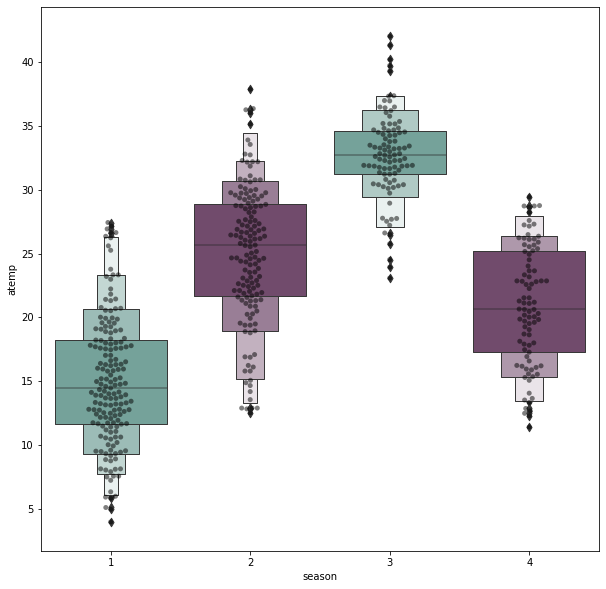

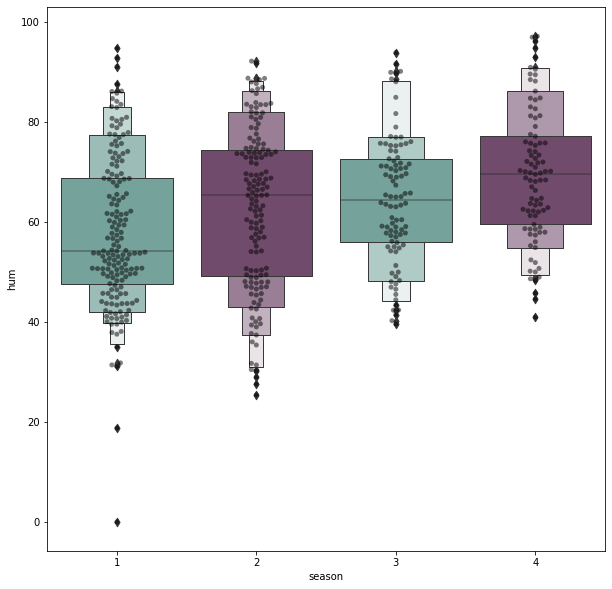

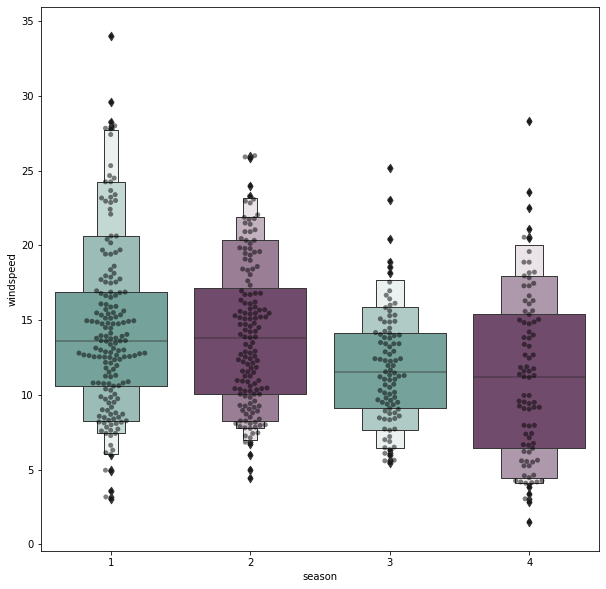

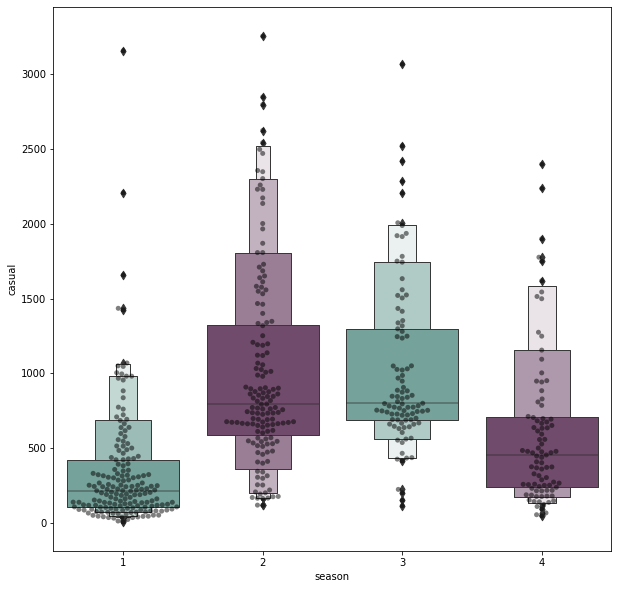

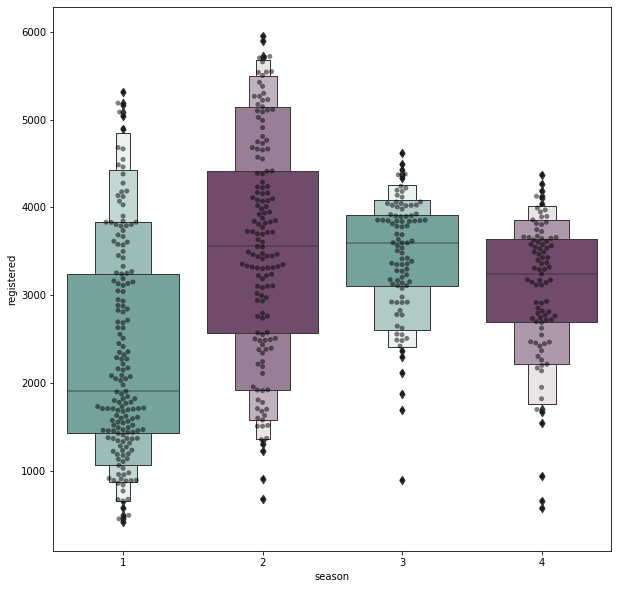

In [36]:
cols = ['#6daa9f','#774571']
feature = ['temp','atemp','hum','windspeed','casual','registered']
for i in feature:
    plt.figure(figsize=(10,10))
    sns.swarmplot(x=train['season'], y=train[i], color='black', alpha=0.5)
    sns.boxenplot(x=train['season'], y=train[i], palette=cols)
    plt.show()

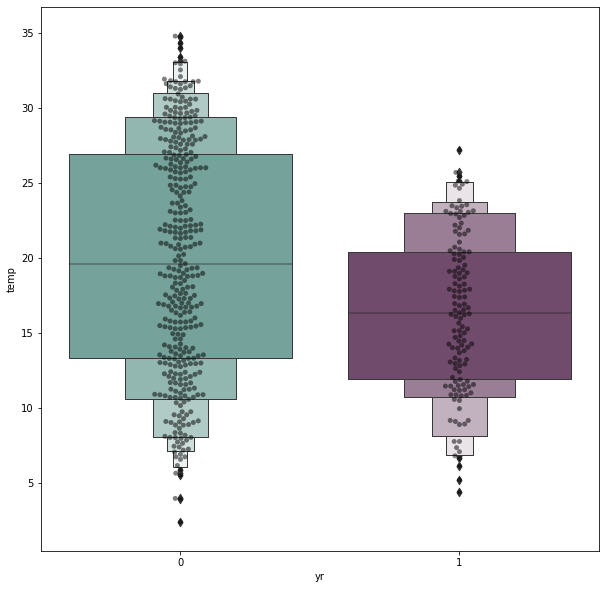

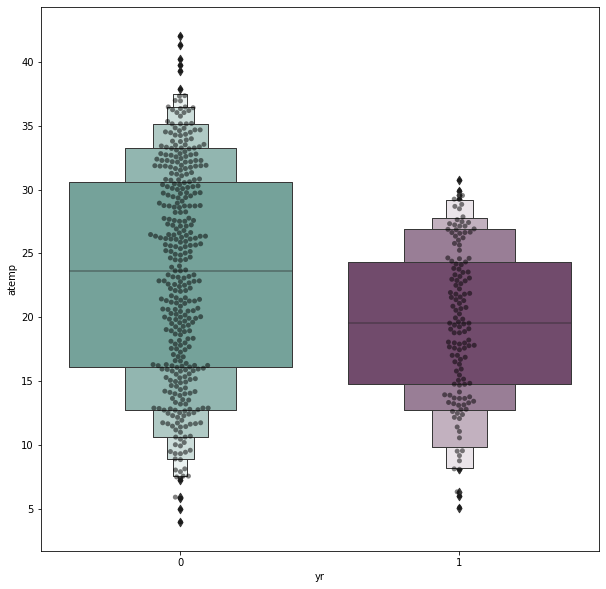

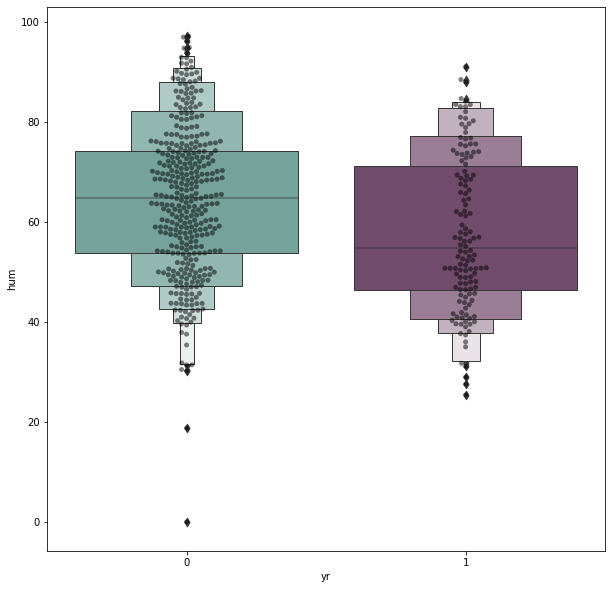

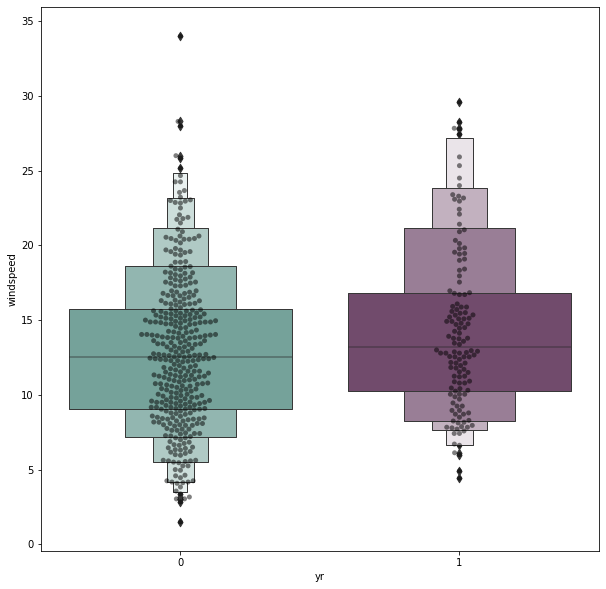

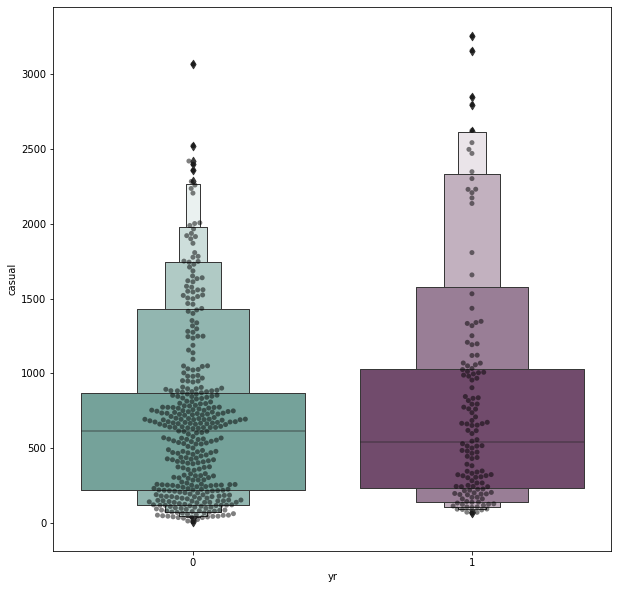

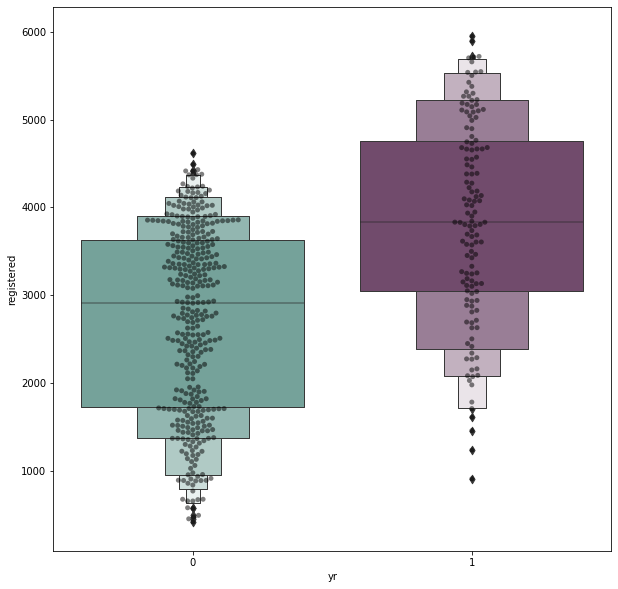

In [37]:
cols = ['#6daa9f','#774571']
feature = ['temp','atemp','hum','windspeed','casual','registered']
for i in feature:
    plt.figure(figsize=(10,10))
    sns.swarmplot(x=train['yr'], y=train[i], color='black', alpha=0.5)
    sns.boxenplot(x=train['yr'], y=train[i], palette=cols)
    plt.show()

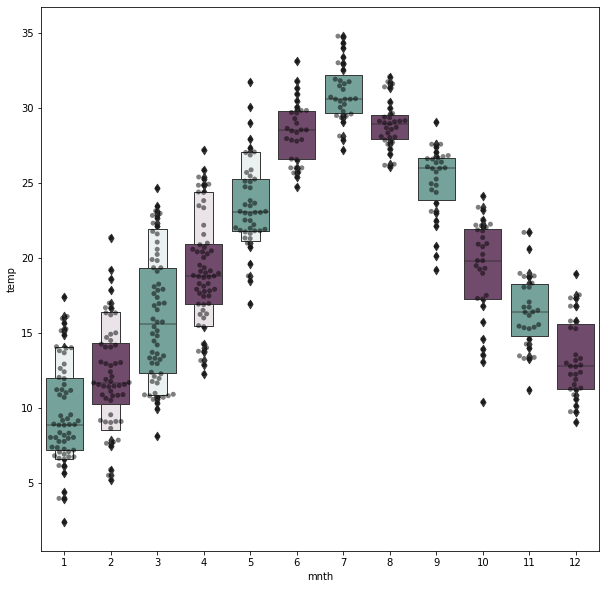

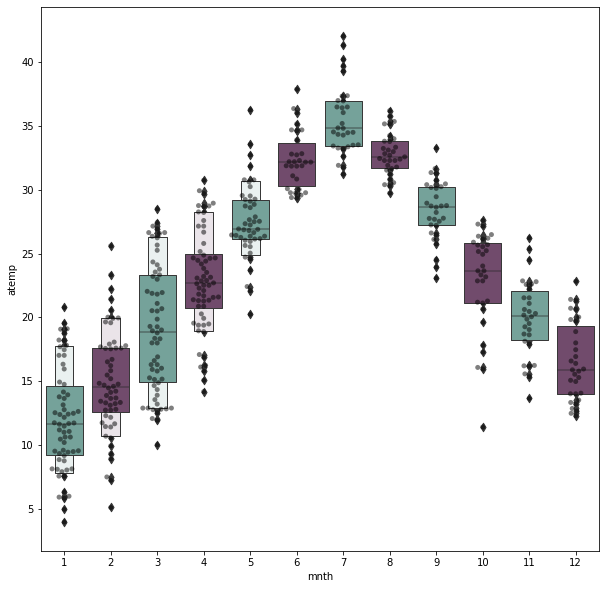

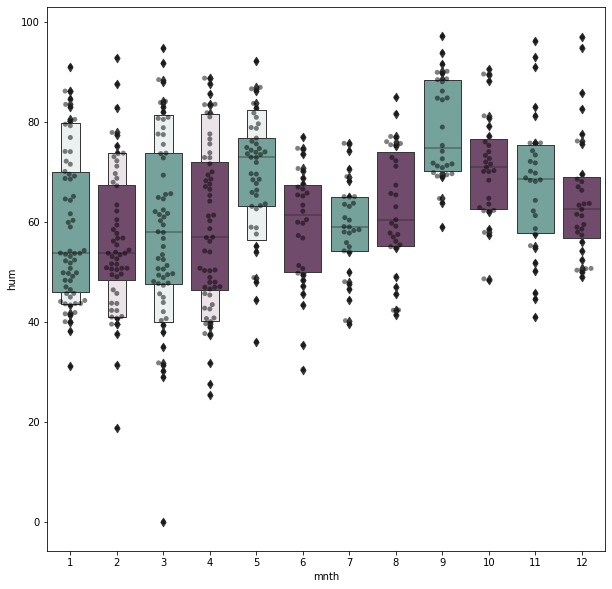

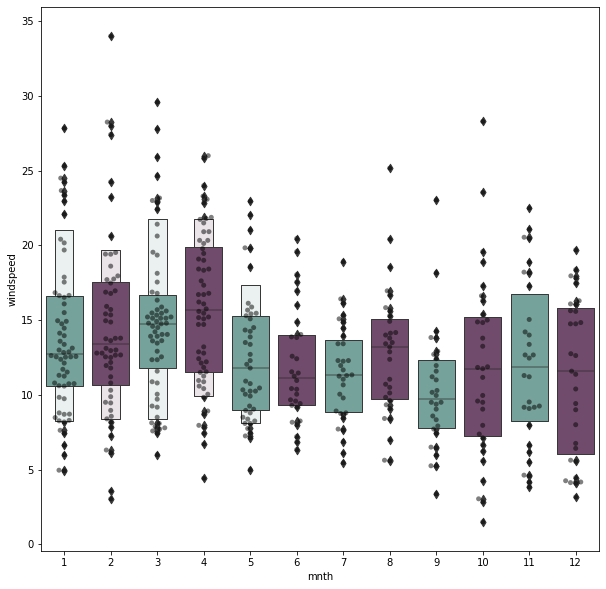

D:\Anaconda\envs\tensorflow\lib\site-packages\seaborn\categorical.py:1296: UserWarning:

17.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



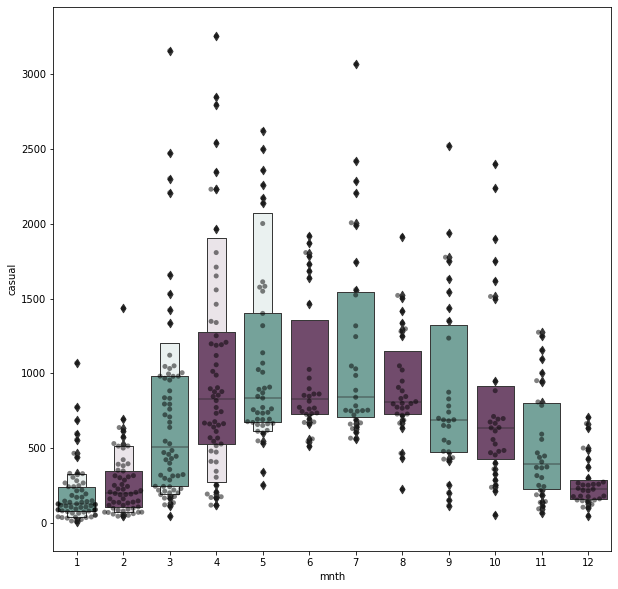

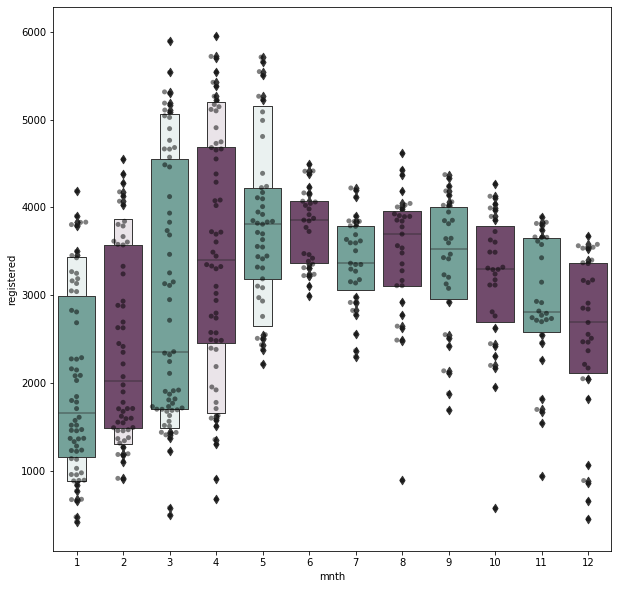

In [38]:
cols = ['#6daa9f','#774571']
feature = ['temp','atemp','hum','windspeed','casual','registered']
for i in feature:
    plt.figure(figsize=(10,10))
    sns.swarmplot(x=train['mnth'], y=train[i], color='black', alpha=0.5)
    sns.boxenplot(x=train['mnth'], y=train[i], palette=cols)
    plt.show()

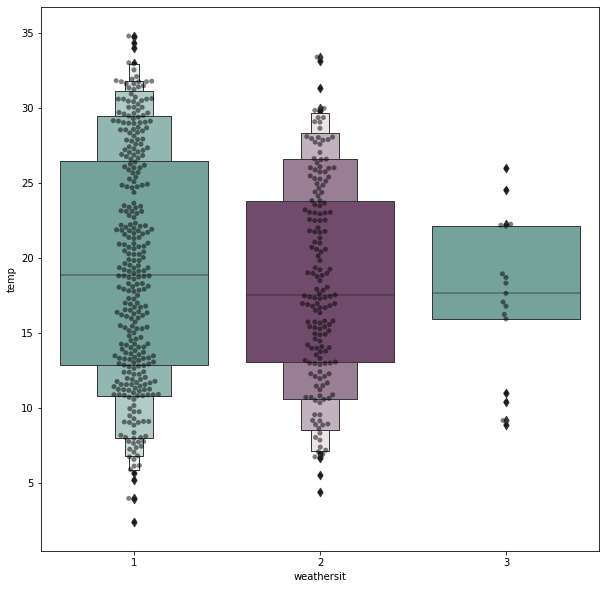

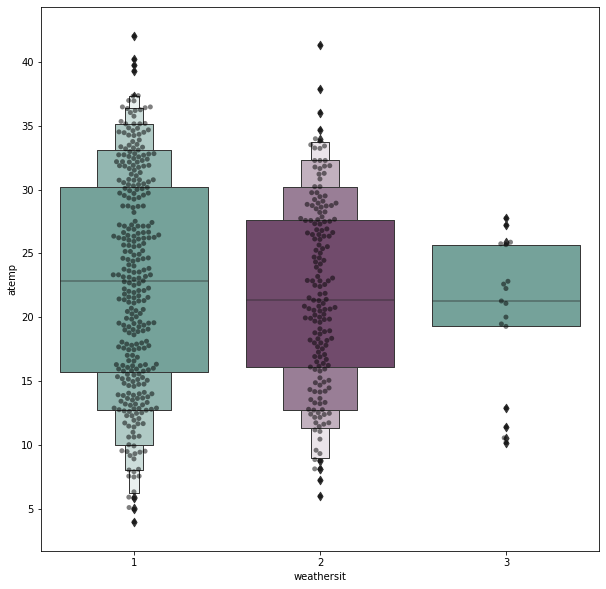

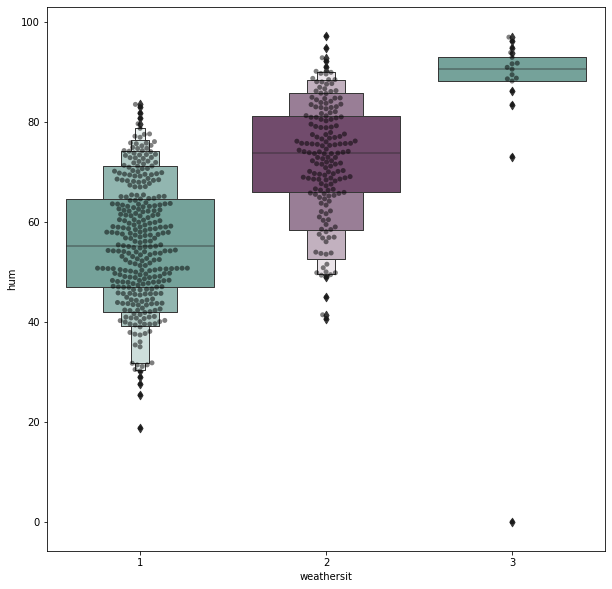

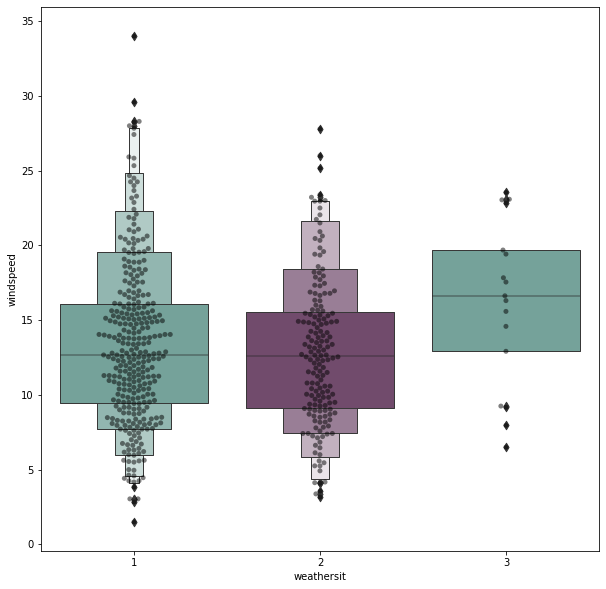

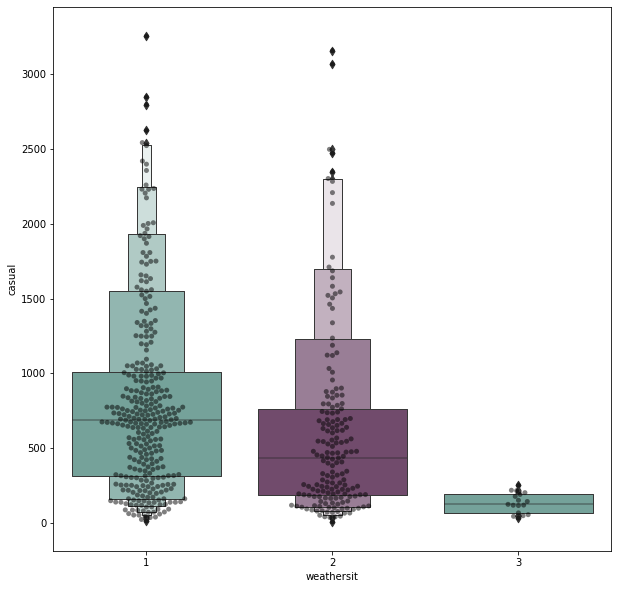

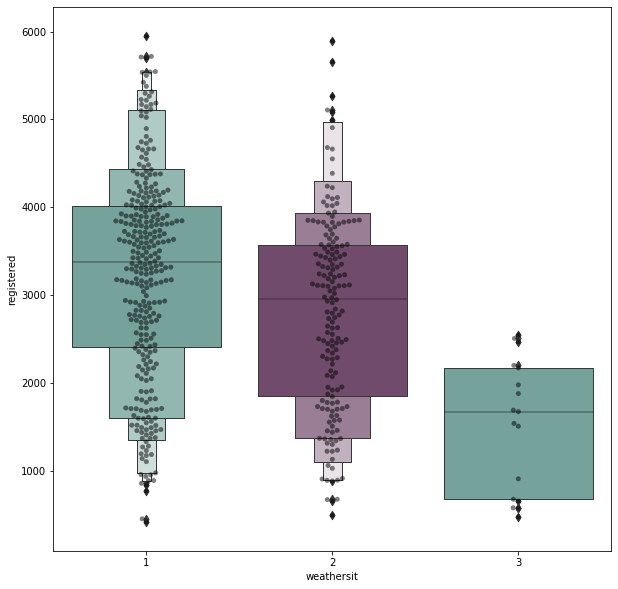

In [39]:
cols = ['#6daa9f','#774571']
feature = ['temp','atemp','hum','windspeed','casual','registered']
for i in feature:
    plt.figure(figsize=(10,10))
    sns.swarmplot(x=train['weathersit'], y=train[i], color='black', alpha=0.5)
    sns.boxenplot(x=train['weathersit'], y=train[i], palette=cols)
    plt.show()

In [40]:
train.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


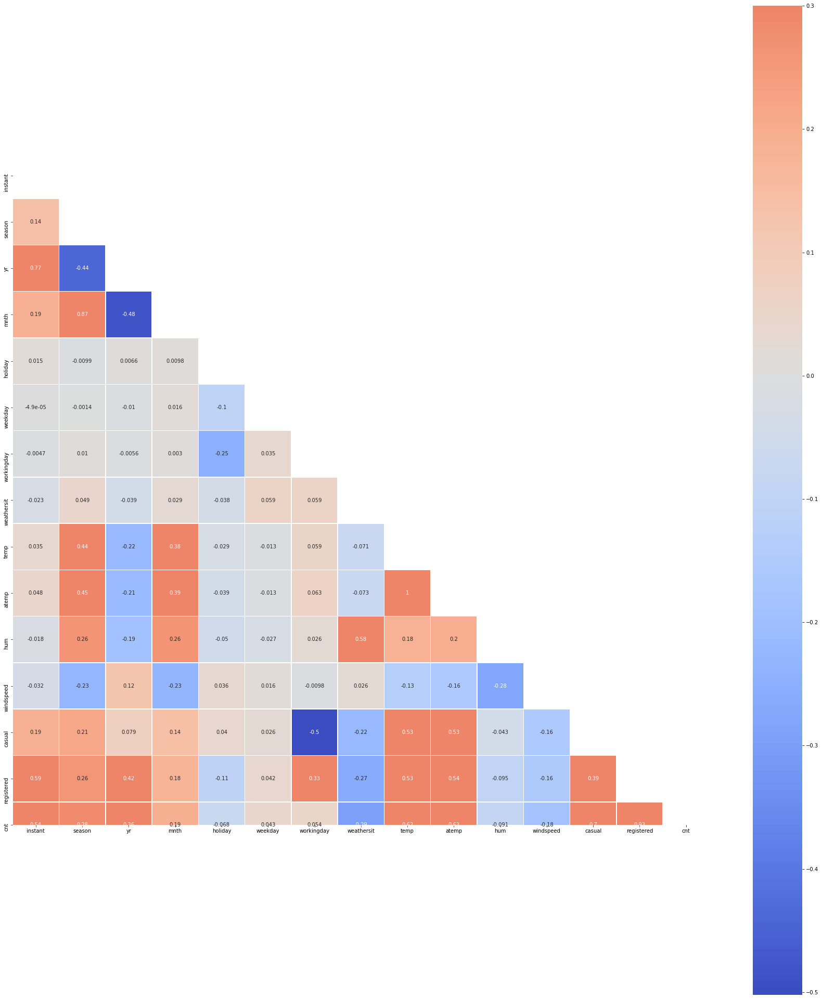

In [41]:
plt.figure(figsize=(30,35))
corr = train.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(train.corr(), mask=mask, cmap='coolwarm', vmax=.3, center=0,
           square=True, linewidths=.5,annot=True)
plt.show()

In [42]:
import networkx as nx
indices = corr.index.values
cor_matrix = np.asmatrix(corr)
G = nx.from_numpy_matrix(cor_matrix)
G = nx.relabel_nodes(G, lambda x: indices[x])
G.edges(data=True)

EdgeDataView([('instant', 'instant', {'weight': 1.0}), ('instant', 'season', {'weight': 0.13796677845545174}), ('instant', 'yr', {'weight': 0.767643868231705}), ('instant', 'mnth', {'weight': 0.1879952526797152}), ('instant', 'holiday', {'weight': 0.01499602185360826}), ('instant', 'weekday', {'weight': -4.852231959062158e-05}), ('instant', 'workingday', {'weight': -0.004665624843708994}), ('instant', 'weathersit', {'weight': -0.023169356776740972}), ('instant', 'temp', {'weight': 0.034552595299427696}), ('instant', 'atemp', {'weight': 0.04831343818826601}), ('instant', 'hum', {'weight': -0.01780680174188088}), ('instant', 'windspeed', {'weight': -0.032240545000476586}), ('instant', 'casual', {'weight': 0.18979369760776169}), ('instant', 'registered', {'weight': 0.5947234347702611}), ('instant', 'cnt', {'weight': 0.5373147961820055}), ('season', 'season', {'weight': 1.0}), ('season', 'yr', {'weight': -0.4406505089369779}), ('season', 'mnth', {'weight': 0.8652546632224773}), ('season', 

In [43]:
def corr_network(G, corr_direction, min_correlation):
    H = G.copy()
    
    for s1, s2, weight in G.edges(data=True):
        if corr_direction == 'positive':
            if weight['weight'] < 0 or weight['weight'] < min_correlation:
                H.remove_edge(s1, s2)
        else:
            if weight['weight'] >= 0 or weight['weight'] > min_correlation:
                H.remove_edge(s1, s2)
                
    edges, weights = zip(*nx.get_edge_attributes(H, 'weight').items())
    
    weights = tuple([(1+abs(x))**2 for x in weights])
    
    d = dict(nx.degree(H))
    nodelist=d.keys()
    node_sizes = d.values()
    
    positions = nx.circular_layout(H)
    
    plt.figure(figsize=(15,15))
    
    nx.draw_networkx_nodes(H,positions, node_color='#d100d1', nodelist=nodelist,
                          node_size=tuple([x**3 for x in node_sizes]), alpha=0.8)
    
    nx.draw_networkx_labels(H, positions, font_size=8)
    
    if corr_direction == 'positive':
        edge_colour = plt.cm.summer
    else:
        edge_colour = plt.cm.autumn
        
    nx.draw_networkx_edges(H, positions, edgelist=edges, style='solid',
                          width=weights, edge_color = weights, edge_cmap = edge_colour,
                          edge_vmin = min(weights), edge_vmax=max(weights))
    
    plt.axis('off')
    plt.show()

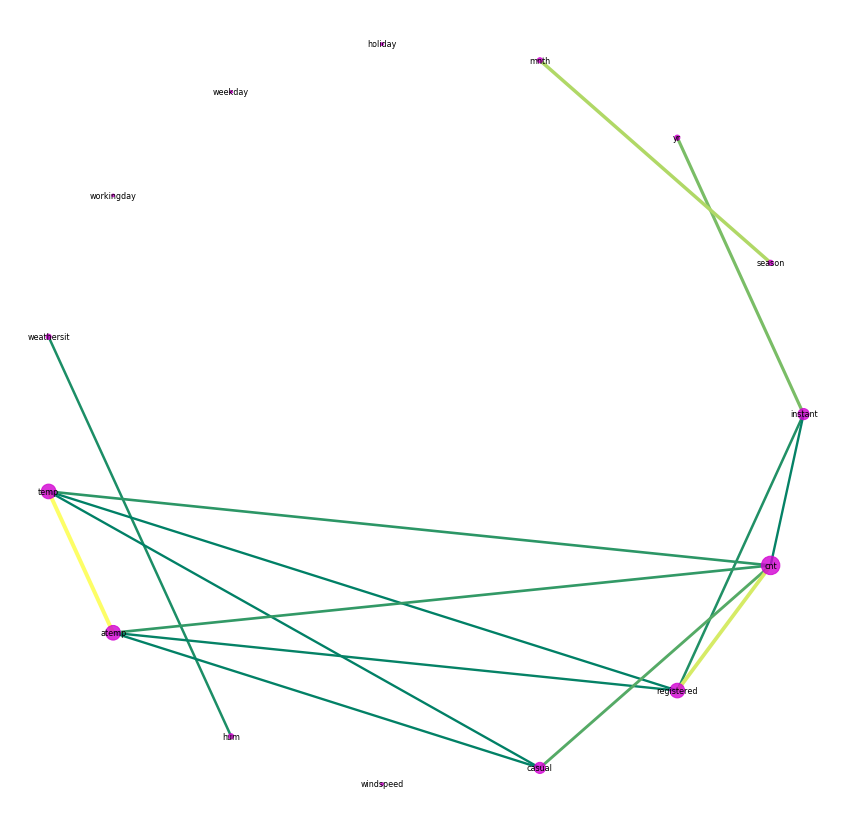

In [44]:
corr_network(G, corr_direction='positive', min_correlation = 0.5)

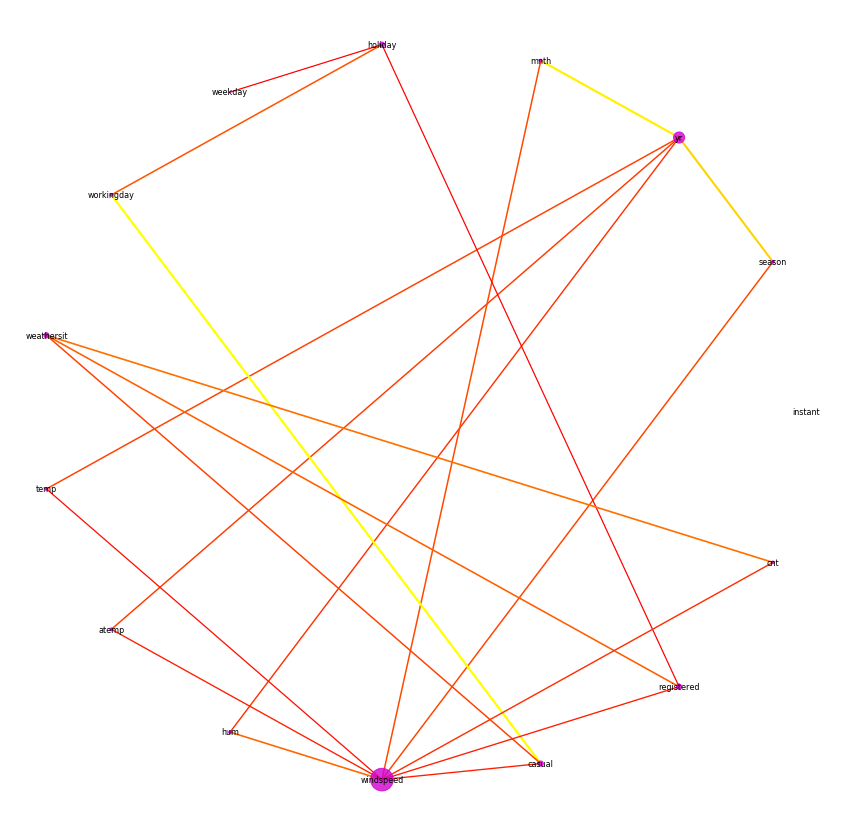

In [45]:
corr_network(G, corr_direction='negative', min_correlation = -0.1)

In [46]:
train.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [47]:
import warnings
warnings.filterwarnings("ignore")

In [48]:
sns.set_style("whitegrid")

In [49]:
def triple_plot(x, title,c):
    fig, ax = plt.subplots(3, 1, figsize=(20,10), sharex=True)
    sns.distplot(x, ax=ax[0], color=c)
    ax[0].set(xlabel=None)
    ax[0].set_title('Histogram + KDE')
    sns.boxplot(x, ax=ax[1], color=c)
    ax[1].set(xlabel=None)
    ax[1].set_title('Boxplot')
    sns.violinplot(x, ax=ax[2], color=c)
    ax[2].set(xlabel=None)
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.tight_layout(pad=3.0)
    plt.show()

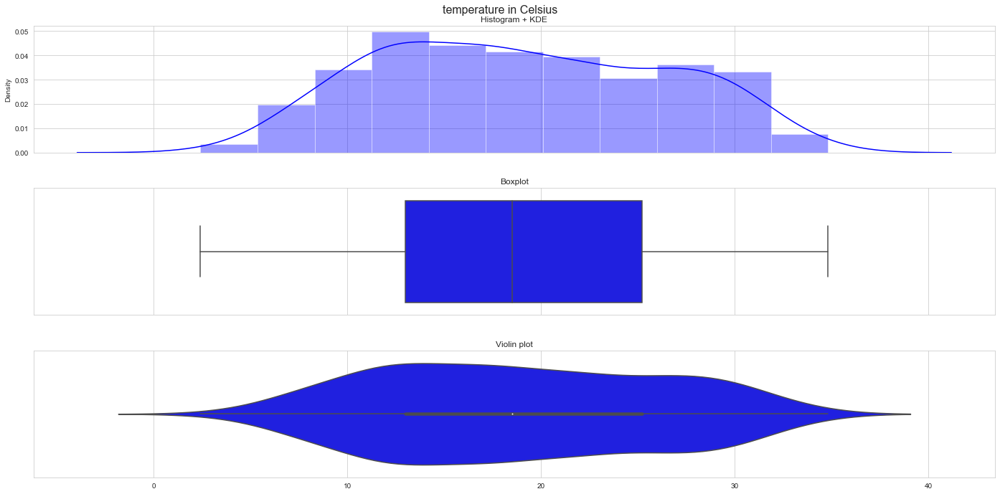

In [50]:
triple_plot(train['temp'],'temperature in Celsius',"blue")

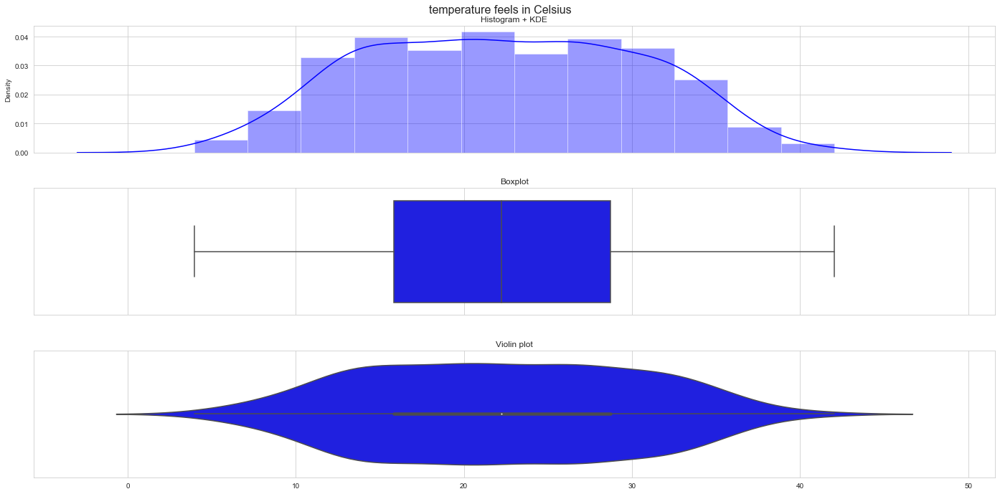

In [51]:
triple_plot(train['atemp'],'temperature feels in Celsius',"blue")

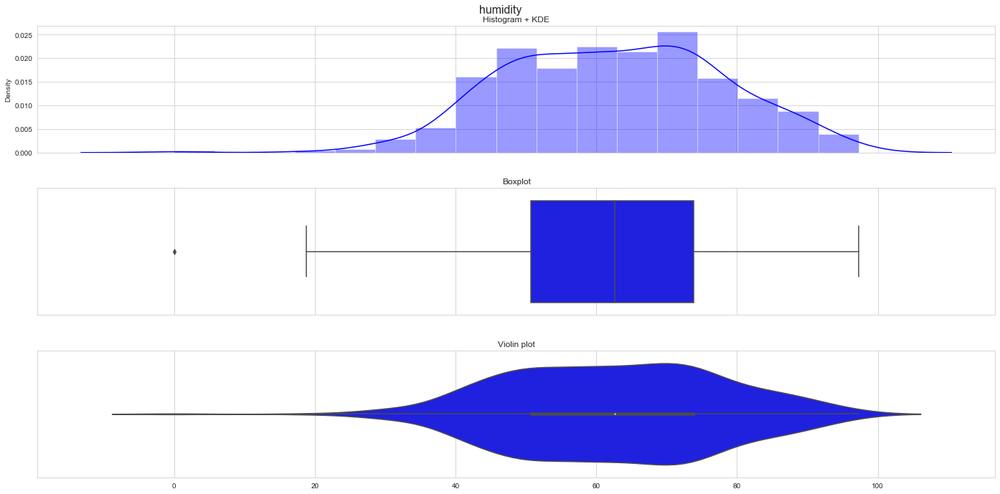

In [52]:
triple_plot(train['hum'],'humidity',"blue")

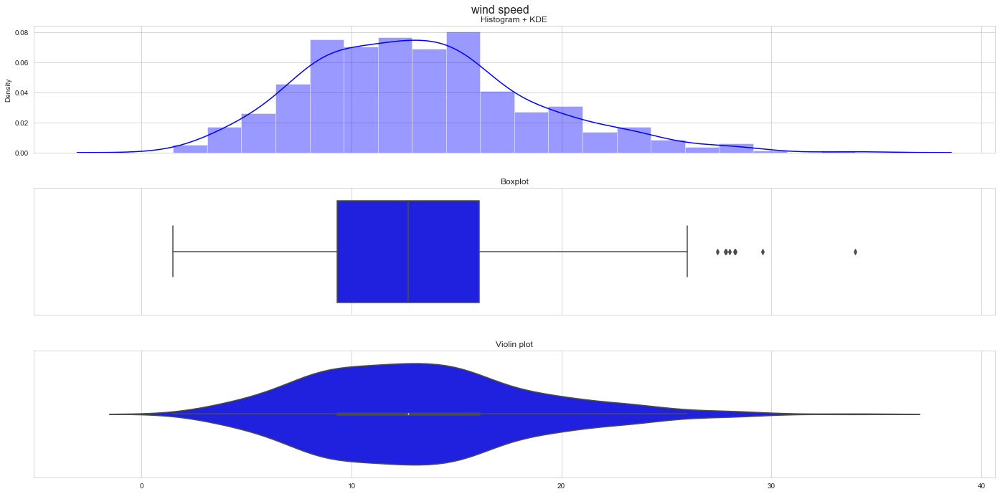

In [53]:
triple_plot(train['windspeed'],'wind speed',"blue")

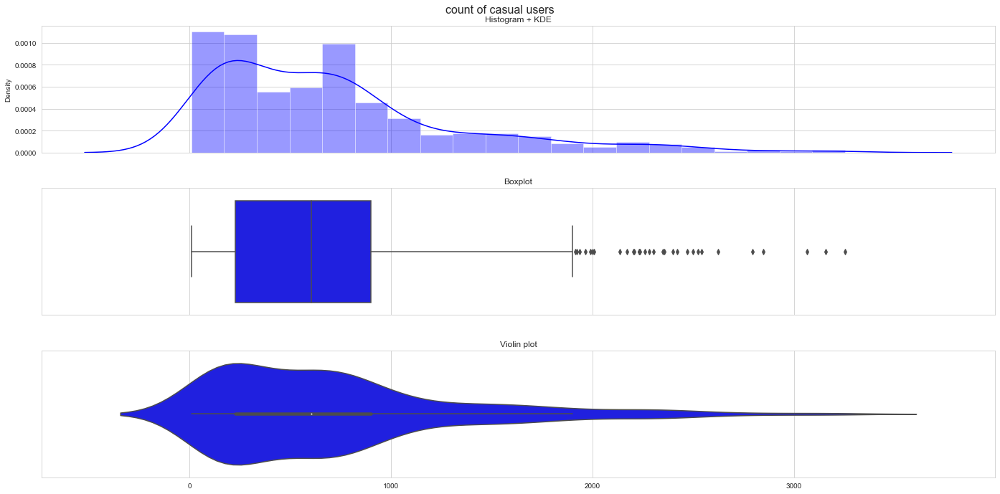

In [54]:
triple_plot(train['casual'],'count of casual users',"blue")

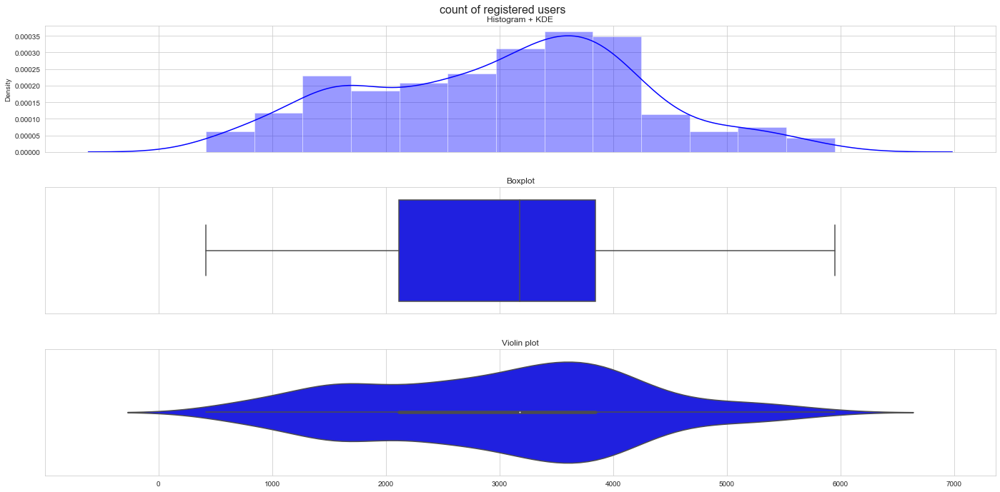

In [55]:
triple_plot(train['registered'],'count of registered users',"blue")

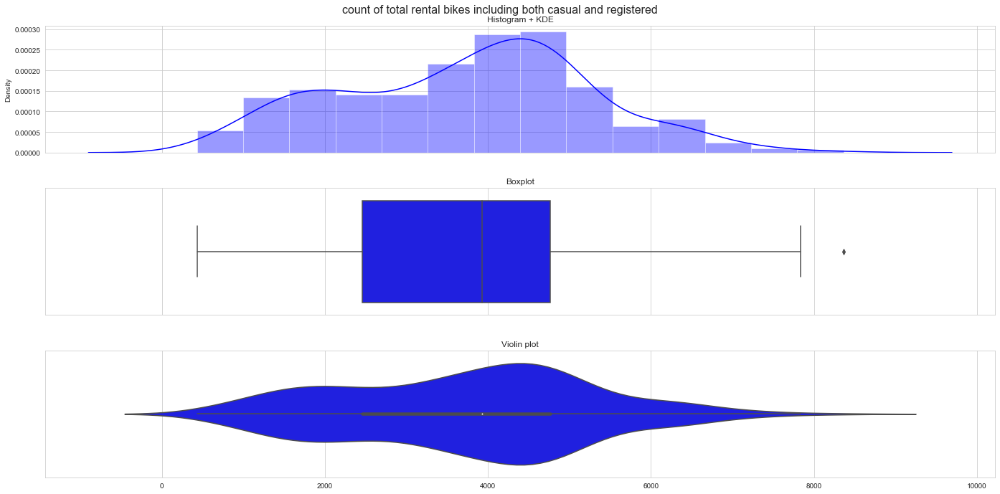

In [56]:
triple_plot(train['cnt'],'count of total rental bikes including both casual and registered',"blue")

In [57]:
for col in train.columns:
    print(col)

instant
dteday
season
yr
mnth
holiday
weekday
workingday
weathersit
temp
atemp
hum
windspeed
casual
registered
cnt


## Converting date-time format into their correct format

In [58]:
print(train['dteday'].head())

0    01-01-2018
1    02-01-2018
2    03-01-2018
3    04-01-2018
4    05-01-2018
Name: dteday, dtype: object


In [59]:
train['dteday'].dtype

dtype('O')

In [60]:
train['date_parsed'] = pd.to_datetime(train['dteday'], format = "%d-%m-%Y")

In [86]:
train['date_parsed'].head()

0   2018-01-01
1   2018-01-02
2   2018-01-03
3   2018-01-04
4   2018-01-05
Name: date_parsed, dtype: datetime64[ns]

In [87]:
train['date_parsed'] = train['date_parsed'].apply(lambda x: x.toordinal())

In [88]:
train['dteday'].head()

0    01-01-2018
1    02-01-2018
2    03-01-2018
3    04-01-2018
4    05-01-2018
Name: dteday, dtype: object

In [89]:
train.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,date_parsed
0,1,01-01-2018,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985,736695
1,2,02-01-2018,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801,736696
2,3,03-01-2018,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349,736697
3,4,04-01-2018,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562,736698
4,5,05-01-2018,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600,736699


In [90]:
features_name = ['instant','date_parsed','season','yr','mnth','holiday','weekday','workingday',
                 'weathersit','temp','atemp','hum','windspeed','casual','registered']
X = train[features_name]
y = train['cnt']

In [91]:
X.head()

,instant,date_parsed,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered
0,1,736695,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654
1,2,736696,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670
2,3,736697,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229
3,4,736698,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454
4,5,736699,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518


In [92]:
y.head()

0     985
1     801
2    1349
3    1562
4    1600
Name: cnt, dtype: int64

### Checking datatypes

In [93]:
train.dtypes

instant          int64
dteday          object
season           int64
yr               int64
mnth             int64
holiday          int64
weekday          int64
workingday       int64
weathersit       int64
temp           float64
atemp          float64
hum            float64
windspeed      float64
casual           int64
registered       int64
cnt              int64
date_parsed      int64
dtype: object

In [94]:
pd.Categorical(train)

['instant', 'dteday', 'season', 'yr', 'mnth', ..., 'windspeed', 'casual', 'registered', 'cnt', 'date_parsed']
Length: 17
Categories (17, object): ['atemp', 'casual', 'cnt', 'date_parsed', ..., 'weekday', 'windspeed', 'workingday', 'yr']

In [95]:
train['season'].unique()

array([1, 2, 3, 4], dtype=int64)

In [96]:
train['weekday'].unique()

array([6, 0, 1, 2, 3, 4, 5], dtype=int64)

In [97]:
train['weathersit'].unique()

array([2, 1, 3], dtype=int64)

In [98]:
pd.Categorical(train['season'])

[1, 1, 1, 1, 1, ..., 2, 2, 2, 2, 2]
Length: 499
Categories (4, int64): [1, 2, 3, 4]

In [99]:
pd.Categorical(train['weekday'])

[6, 0, 1, 2, 3, ..., 4, 5, 6, 0, 1]
Length: 499
Categories (7, int64): [0, 1, 2, 3, 4, 5, 6]

In [100]:
pd.Categorical(train['weathersit'])

[2, 2, 1, 1, 1, ..., 1, 1, 1, 1, 2]
Length: 499
Categories (3, int64): [1, 2, 3]

### importance of features

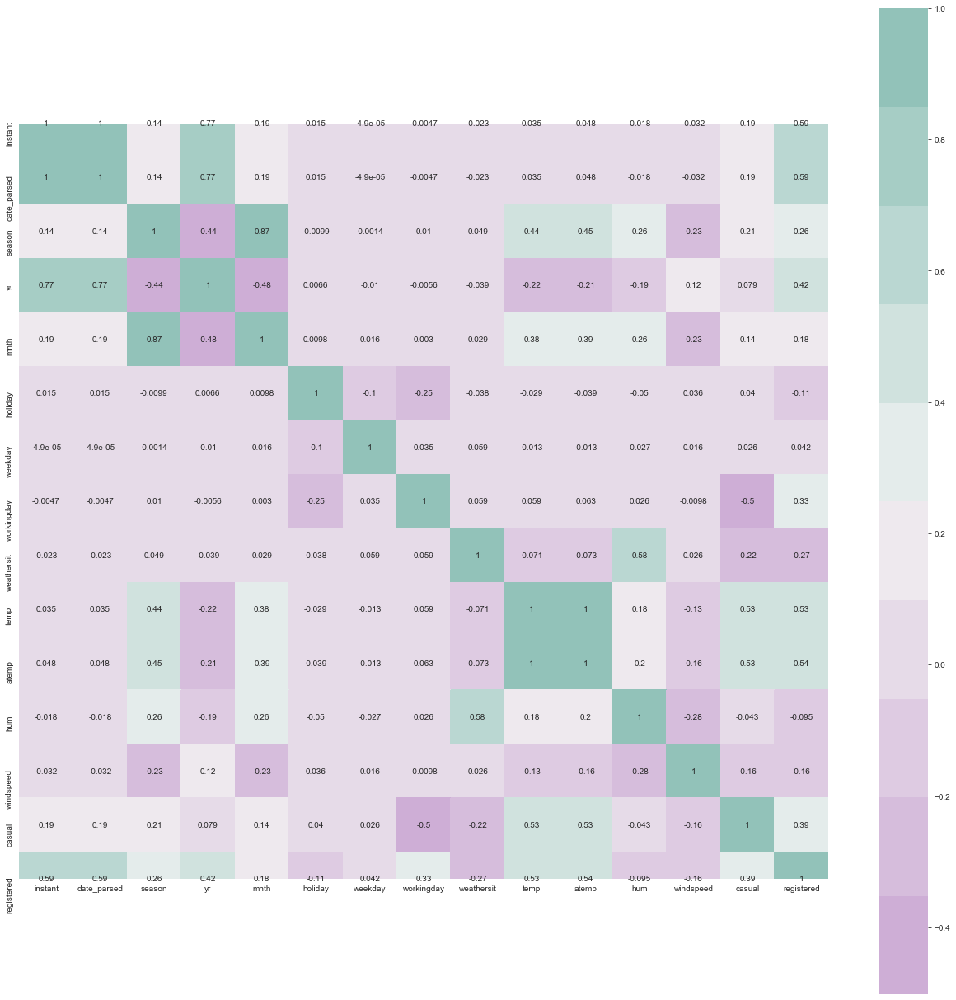

In [101]:
cmap1 = sns.diverging_palette(300,175,s=40,l=75,n=10)
corrmat = X.corr()
plt.subplots(figsize=(22,22))
sns.heatmap(corrmat, cmap=cmap1, annot=True, square=True);

In [102]:
from sklearn.model_selection import train_test_split

In [114]:
X_train, X_test,y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [116]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [117]:
c=reg.predict(X_test)

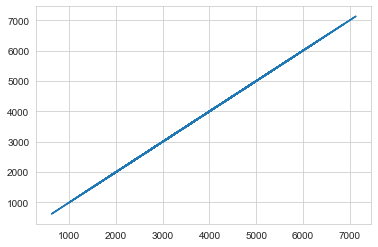

In [118]:
plt.plot(c,y_test)

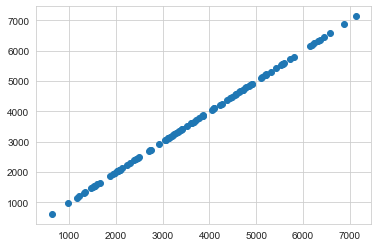

In [113]:
plt.scatter(c,y_test)

In [128]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error,r2_score
def train_model(m, name):
    model = m
    model.fit(X=X_train, y=y_train)
    predictions = model.predict(X_test)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    print("{0} mae {1} r2 {2}".format(name, mae, r2))
    
train_model(DecisionTreeRegressor(), "Decision Tree Regressor")
train_model(RandomForestRegressor(), 'Random Forest Regressor')
train_model(XGBRegressor(n_estimators=600), "XGBoost Regressor")

Decision Tree Regressor mae 203.7 r2 0.9625137855654756
Random Forest Regressor mae 123.4513 r2 0.9802819464237682
XGBoost Regressor mae 143.68213439941405 r2 0.976166407412197
